## Automatic Strain Results 

In [5]:


pv.set_jupyter_backend('trame')
mesh = pv.read('/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/bav001-4DTEE/manual/mesh_med_recon_tp_001.vtp')
print(mesh.cell_data)
print(mesh.point_data)


pyvista DataSetAttributes
Association     : CELL
Active Scalars  : None
Active Vectors  : None
Active Texture  : None
Active Normals  : None
Contains arrays :
    I1_Cell                 float64    (1728,)
    J_Cell                  float64    (1728,)
    Long_Strain_Cell        float64    (1728,)
    Circ_Strain_Cell        float64    (1728,)
    Normal_Cell             float64    (1728, 3)
    Longitudinal_Cell       float64    (1728, 3)
    Circumferential_Cell    float64    (1728, 3)
pyvista DataSetAttributes
Association     : POINT
Active Scalars  : None
Active Vectors  : None
Active Texture  : None
Active Normals  : None
Contains arrays :
    Label                   float64    (900, 4)
    Thickness               float64    (900,)
    Radius                  float64    (900,)
    STJ                     float64    (900,)
    LVO                     float64    (900,)
    Curv_Gaussian           float64    (900,)
    Curv_Mean               float64    (900,)
    I1_Pt             

In [19]:
import numpy as np
from scipy.spatial.transform import Rotation as R
import pyvista as pv
import os 
def load_shapes_from_vtk(file_path):
    # Load the VTK file
    mesh = pv.read(f"{file_path}")
    # Extract points as a numpy array
    shape = mesh.cell_data_to_point_data().points
    return shape
def center_shape(shape):
    """Centers a shape around its centroid."""
    centroid = np.mean(shape, axis=0)
    return shape - centroid

def scale_shape(shape):
    """Scales a shape to have unit RMS distance."""
    rms = np.sqrt(np.sum(shape**2) / shape.shape[0])
    return shape / rms


def align_shapes(A, B):
    """Aligns shape B to shape A using Procrustes analysis."""
    # Center the shapes
    A_centered = A - np.mean(A, axis=0)
    B_centered = B - np.mean(B, axis=0)
    
    # Compute the scaling factor
    norm_A = np.linalg.norm(A_centered)
    norm_B = np.linalg.norm(B_centered)
    scale = norm_A / norm_B

    # Scale B
    B_scaled = B_centered * scale

    # Compute the optimal rotation using SVD
    U, S, Vt = np.linalg.svd(B_scaled.T @ A_centered)
    R_optimal = U @ Vt

    # Correct for reflection
    if np.linalg.det(R_optimal) < 0:
        Vt[-1, :] *= -1
        R_optimal = U @ Vt

    # Apply the rotation to B
    B_aligned = B_scaled @ R_optimal

    # Translate B back to match A
    B_aligned += np.mean(A, axis=0)

    return B_aligned, R_optimal
    """Aligns shape B to shape A using Procrustes analysis."""
    # Center the shapes
    A_centered = A - np.mean(A, axis=0)
    B_centered = B - np.mean(B, axis=0)
    
    # Compute the scaling factor
    norm_A = np.linalg.norm(A_centered)
    norm_B = np.linalg.norm(B_centered)
    scale = norm_A / norm_B

    # Scale B
    B_scaled = B_centered * scale

    # Compute the optimal rotation using SVD
    U, S, Vt = np.linalg.svd(B_scaled.T @ A_centered)
    R_optimal = U @ Vt

    # Correct for reflection
    if np.linalg.det(R_optimal) < 0:
        Vt[-1, :] *= -1
        R_optimal = U @ Vt

    # Apply the rotation to B
    B_aligned = B_scaled @ R_optimal

    # Translate B back to match A
    B_aligned += np.mean(A, axis=0)

    return B_aligned, R_optimal, scale
    # H = B.T @ A
    # U, S, Vt = np.linalg.svd(H)
    # R_optimal = Vt.T @ U.T

    # # Correct potential reflection
    # if np.linalg.det(R_optimal) < 0:
    #     Vt[-1, :] *= -1
    #     R_optimal = Vt.T @ U.T

    # B_aligned = B @ R_optimal
    # return B_aligned, R_optimal

def generalized_procrustes_analysis(shapes, tol=1e-5, max_iter=100):
    """Performs Generalized Procrustes Analysis on a list of 3D shapes."""
    num_shapes = len(shapes)
    shapes_centered_scaled = [center_shape(shape) for shape in shapes]

    # Initialize the consensus shape (e.g., first shape)
    consensus = shapes_centered_scaled[0]
    
    for iteration in range(max_iter):
        new_shapes = []
        for shape in shapes_centered_scaled:
            shape_aligned, _ = align_shapes(consensus, shape)
            new_shapes.append(shape_aligned)
        
        new_consensus = np.mean(new_shapes, axis=0)
        
        # Check convergence
        if np.linalg.norm(new_consensus - consensus) < tol:
            break
        
        consensus = new_consensus

    return consensus, new_shapes

# Example Usage
if __name__ == "__main__":
    # Generate example 3D shapes
    vtk_directory = '/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/bav001-4DTEE/auto'
    vtk_files = [os.path.join(vtk_directory, file) for file in os.listdir(vtk_directory) if file.endswith('.vtp')]
    shapes = [load_shapes_from_vtk(file) for file in vtk_files]
    # Perform GPA
    consensus, aligned_shapes = generalized_procrustes_analysis(shapes)

    print("Consensus shape:")
    print(consensus)


/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_92989/1371539004.py:14: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return shape - centroid
/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_92989/1371539004.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  A_centered = A - np.mean(A, axis=0)
/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_92989/1371539004.py:26: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  B_centered = B - np.mean(B, axis=0)
/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_92989/1371539004.py:34: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  B_scaled = B_centere

Consensus shape:
[[-11.479778   12.832862   -2.5238855]
 [-10.135545   13.016408   -3.2227106]
 [ -8.87121    13.096394   -3.7739446]
 ...
 [ 16.239773    6.6026373  -7.498057 ]
 [ 17.157732    5.729575   -7.3873463]
 [ 17.762346    5.4333005  -7.421109 ]]


In [20]:
import plotly.graph_objects as go
import numpy as np
from sklearn.decomposition import PCA
aligned_shapes_flat = [shape.flatten() for shape in aligned_shapes]
data_matrix = np.array(aligned_shapes_flat)  # Shape: (n_shapes, n_points * 3)

# Step 1: Calculate Principal Components on Combined Aligned Shapes
def calculate_principal_components_all_shapes(data_matrix, n_components=3):
    # Flatten each aligned shape

# Create a data matrix where each row is a flattened shape
  # Shape: (n_shapes, n_points * n_dims)
    pca = PCA(n_components=n_components)
    pca.fit(data_matrix)

    return pca.components_, pca.explained_variance_

# Step 2: Generate Shape Variations Along Principal Components
def generate_shape_variations_all_shapes(consensus, components, variances, steps=3):
    consensus_flat = consensus.flatten()  # Flatten the consensus shape
    variations = {}
    for i, (component, variance) in enumerate(zip(components, variances)):
        variations[f"PC{i+1}"] = []
        for step in range(-steps, steps + 1):
            scale = step * np.sqrt(variance)
            # Generate variation in flattened form
            variation_flat = consensus_flat + scale * component
            # Reshape back to the original shape
            variation = variation_flat.reshape(consensus.shape)
            variations[f"PC{i+1}"].append((f"PC{i+1}_step_{step}", variation))
    return variations


# Calculate PCA and Generate Shape Variations
all_shapes_matrix = np.vstack(aligned_shapes)  # Stack all aligned shapes
components, variances = calculate_principal_components_all_shapes(data_matrix)
shape_variations = generate_shape_variations_all_shapes(consensus, components, variances)

# Step 3: Plot with Separate Sliders for Each Principal Component
def plot_pca_variations_plotly_separate_sliders(consensus, shape_variations):
    fig = go.Figure()

    # Initial plot of consensus shape
    fig.add_trace(go.Scatter3d(
        x=consensus[:, 0], y=consensus[:, 1], z=consensus[:, 2],
        mode='markers',
        marker=dict(size=5, color='red'),
        name="Consensus Shape"
    ))

    # Create frames for each principal component variation
    frames = []
    sliders = []
    for i, (pc, variations) in enumerate(shape_variations.items()):
        slider_steps = []
        for frame_name, variation in variations:
            frames.append(go.Frame(
                data=[go.Scatter3d(
                    x=variation[:, 0], y=variation[:, 1], z=variation[:, 2],
                    mode='markers',
                    marker=dict(size=5, color='blue'),
                )],
                name=frame_name
            ))
            slider_steps.append(dict(
                method="animate",
                label=frame_name.split('_')[-1],  # Use just the step number for labeling
                args=[[frame_name], dict(mode="immediate", frame=dict(duration=0, redraw=True), transition=dict(duration=0))]
            ))

        # Position sliders vertically by adjusting `y` value
        sliders.append(dict(
            active=len(variations) // 2,  # Center slider at neutral position
            currentvalue=dict(prefix=f"{pc} Variation: "),
            pad=dict(t=50),
            y=0 - i * 0.5,  # Adjust vertical position for each slider
            steps=slider_steps
        ))

    fig.frames = frames

    # Add sliders for each principal component
        # Update the layout with custom width and height
    fig.update_layout(
        title="Principal Component Variations of Aligned Shapes",
        width=1000,  # Set the desired width
        height=800,  # Set the desired height
        scene=dict(
            xaxis_title="X Axis",
            yaxis_title="Y Axis",
            zaxis_title="Z Axis"
        ),
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            buttons=[dict(label="Play", method="animate", args=[None, dict(frame=dict(duration=50, redraw=True), fromcurrent=True)]),
                    dict(label="Pause", method="animate", args=[[None], dict(frame=dict(duration=0, redraw=True), mode="immediate")])])],
        sliders=sliders
    )

    fig.show()

# Usage
plot_pca_variations_plotly_separate_sliders(consensus, shape_variations)


In [22]:
print(mesh['Circ_Strain_Cell'])

[1.12117389 1.12043142 1.10790185 ... 0.77412624 0.77112644 0.7623188 ]


In [27]:
##trying with cell data
import pyvista as pv

def load_shapes_from_vtk(file_path,strain):
    # Load the VTK file
    mesh = pv.read(file_path)
    # Extract points and faces
    points = mesh.points
    faces = mesh.faces 
    strain_info = mesh[strain]
    # Note: faces array includes the number of points per face
    return points, faces, strain_info
vtk_directory = '/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/bav001-4DTEE/auto'
vtk_files = [os.path.join(vtk_directory, file) for file in os.listdir(vtk_directory) if file.endswith('.vtp')]
points, faces, circ_strain = load_shapes_from_vtk(vtk_files[0], 'Circ_Strain_Cell')
#shapes = [load_shapes_from_vtk(file) for file in vtk_files]
def generate_shape_variations_all_shapes(consensus_points, components, variances, steps=3):
    consensus_flat = consensus_points.flatten()  # Shape: (n_points * 3,)
    variations = {}
    for i, (component, variance) in enumerate(zip(components, variances)):
        variations[f"PC{i+1}"] = []
        for step in range(-steps, steps + 1):
            scale = step * np.sqrt(variance)
            # Generate variation in flattened form
            variation_flat = consensus_flat + scale * component
            # Reshape back to the original shape
            variation_points = variation_flat.reshape(consensus_points.shape)  # Shape: (n_points, 3)
            variations[f"PC{i+1}"].append((f"PC{i+1}_step_{step}", variation_points))
    return variations

import plotly.graph_objects as go

def plot_pca_variations_plotly_mesh(consensus_points, faces, shape_variations):
    # Prepare face indices for Plotly (faces need to be triangles)
    # Extract the faces as a list of lists, skipping the number of points per face
    # Assuming triangular faces (3 vertices per face)
    faces_indices = faces.reshape(-1, 4)[:, 1:]  # Shape: (n_faces, 3)
    
    # Initial plot of the consensus shape as a mesh
    fig = go.Figure()

    fig.add_trace(go.Mesh3d(
        x=consensus_points[:, 0],
        y=consensus_points[:, 1],
        z=consensus_points[:, 2],
        i=faces_indices[:, 0],
        j=faces_indices[:, 1],
        k=faces_indices[:, 2],
        opacity=0.5,
        color='red',
        name="Consensus Shape"
    ))

    # Create frames for each variation along principal components
    frames = []
    sliders = []
    for i, (pc, variations) in enumerate(shape_variations.items()):
        slider_steps = []
        for frame_name, variation_points in variations:
            frames.append(go.Frame(
                data=[go.Mesh3d(
                    x=variation_points[:, 0],
                    y=variation_points[:, 1],
                    z=variation_points[:, 2],
                    i=faces_indices[:, 0],
                    j=faces_indices[:, 1],
                    k=faces_indices[:, 2],
                    opacity=0.5, # Set color to the strain values
                    colorscale='Viridis',  # Choose a color scale
                    colorbar=dict(title="Strain"),  # Add colorbar for strain
                )],
                name=frame_name
            ))
            slider_steps.append(dict(
                method="animate",
                label=frame_name.split('_')[-1],
                args=[[frame_name], dict(mode="immediate", frame=dict(duration=0, redraw=True), transition=dict(duration=0))]
            ))

        # Position sliders vertically by adjusting `y` value
        sliders.append(dict(
            active=len(variations) // 2,
            currentvalue=dict(prefix=f"{pc} Variation: "),
            pad=dict(t=50),
            y=0 - i * 0.5,  # Adjust vertical position for each slider
            steps=slider_steps
        ))

    fig.frames = frames

    # Update the layout with custom width and height
    fig.update_layout(
        title="Principal Component Variations of Aligned Shapes (Mesh Visualization)",
        width=1000,
        height=800,
        scene=dict(
            xaxis_title="X Axis",
            yaxis_title="Y Axis",
            zaxis_title="Z Axis"
        ),
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            buttons=[
                dict(
                    label="Play",
                    method="animate",
                    args=[None, dict(frame=dict(duration=50, redraw=True), fromcurrent=True)]
                ),
                dict(
                    label="Pause",
                    method="animate",
                    args=[[None], dict(frame=dict(duration=0, redraw=True), mode="immediate")]
                )
            ]
        )],
        sliders=sliders
    )

    fig.show()

plot_pca_variations_plotly_mesh(consensus, faces, shape_variations)


## Manual Strain Results

In [6]:
import numpy as np
from scipy.spatial.transform import Rotation as R
import pyvista as pv
import os 
def load_shapes_from_vtk(file_path):
    # Load the VTK file
    mesh = pv.read(f"{file_path}")
    # Extract points as a numpy array
    shape = mesh.cell_data_to_point_data().points
    return shape
def center_shape(shape):
    """Centers a shape around its centroid."""
    centroid = np.mean(shape, axis=0)
    return shape - centroid

def scale_shape(shape):
    """Scales a shape to have unit RMS distance."""
    rms = np.sqrt(np.sum(shape**2) / shape.shape[0])
    return shape / rms


def align_shapes(A, B):
    """Aligns shape B to shape A using Procrustes analysis."""
    # Center the shapes
    A_centered = A - np.mean(A, axis=0)
    B_centered = B - np.mean(B, axis=0)
    
    # Compute the scaling factor
    norm_A = np.linalg.norm(A_centered)
    norm_B = np.linalg.norm(B_centered)
    scale = norm_A / norm_B

    # Scale B
    B_scaled = B_centered * scale

    # Compute the optimal rotation using SVD
    U, S, Vt = np.linalg.svd(B_scaled.T @ A_centered)
    R_optimal = U @ Vt

    # Correct for reflection
    if np.linalg.det(R_optimal) < 0:
        Vt[-1, :] *= -1
        R_optimal = U @ Vt

    # Apply the rotation to B
    B_aligned = B_scaled @ R_optimal

    # Translate B back to match A
    B_aligned += np.mean(A, axis=0)

    return B_aligned, R_optimal
    """Aligns shape B to shape A using Procrustes analysis."""
    # Center the shapes
    A_centered = A - np.mean(A, axis=0)
    B_centered = B - np.mean(B, axis=0)
    
    # Compute the scaling factor
    norm_A = np.linalg.norm(A_centered)
    norm_B = np.linalg.norm(B_centered)
    scale = norm_A / norm_B

    # Scale B
    B_scaled = B_centered * scale

    # Compute the optimal rotation using SVD
    U, S, Vt = np.linalg.svd(B_scaled.T @ A_centered)
    R_optimal = U @ Vt

    # Correct for reflection
    if np.linalg.det(R_optimal) < 0:
        Vt[-1, :] *= -1
        R_optimal = U @ Vt

    # Apply the rotation to B
    B_aligned = B_scaled @ R_optimal

    # Translate B back to match A
    B_aligned += np.mean(A, axis=0)

    return B_aligned, R_optimal, scale
    # H = B.T @ A
    # U, S, Vt = np.linalg.svd(H)
    # R_optimal = Vt.T @ U.T

    # # Correct potential reflection
    # if np.linalg.det(R_optimal) < 0:
    #     Vt[-1, :] *= -1
    #     R_optimal = Vt.T @ U.T

    # B_aligned = B @ R_optimal
    # return B_aligned, R_optimal

def generalized_procrustes_analysis(shapes, tol=1e-5, max_iter=100):
    """Performs Generalized Procrustes Analysis on a list of 3D shapes."""
    num_shapes = len(shapes)
    shapes_centered_scaled = [center_shape(shape) for shape in shapes]

    # Initialize the consensus shape (e.g., first shape)
    consensus = shapes_centered_scaled[0]
    
    for iteration in range(max_iter):
        new_shapes = []
        for shape in shapes_centered_scaled:
            shape_aligned, _ = align_shapes(consensus, shape)
            new_shapes.append(shape_aligned)
        
        new_consensus = np.mean(new_shapes, axis=0)
        
        # Check convergence
        if np.linalg.norm(new_consensus - consensus) < tol:
            break
        
        consensus = new_consensus

    return consensus, new_shapes

# Example Usage
if __name__ == "__main__":
    # Generate example 3D shapes
    vtk_directory = '/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/bav001-4DTEE/manual'
    vtk_files = [os.path.join(vtk_directory, file) for file in os.listdir(vtk_directory) if file.endswith('.vtp')]
    shapes = [load_shapes_from_vtk(file) for file in vtk_files]
    # Perform GPA
    consensus, aligned_shapes = generalized_procrustes_analysis(shapes)

    print("Consensus shape:")
    print(consensus)


/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_84281/1969344980.py:14: DeprecationWarning:

__array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)

/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_84281/1969344980.py:25: DeprecationWarning:

__array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)

/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_84281/1969344980.py:26: DeprecationWarning:

__array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)

/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_84281/1969344980.py:34: DeprecationWarning:

__array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)

/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_84281/1969344980.py:37: DeprecationWarning:

__array_wrap

Consensus shape:
[[-10.611223   15.169478   -2.0830948]
 [-10.237041   15.053068   -2.1271906]
 [ -9.59705    14.851803   -2.1982145]
 ...
 [ 10.945581   13.249445   -2.6204839]
 [ 11.607632   13.192217   -2.691058 ]
 [ 11.896485   13.134018   -2.718197 ]]


In [7]:
import plotly.graph_objects as go
import numpy as np
from sklearn.decomposition import PCA
aligned_shapes_flat = [shape.flatten() for shape in aligned_shapes]
data_matrix = np.array(aligned_shapes_flat)  # Shape: (n_shapes, n_points * 3)

# Step 1: Calculate Principal Components on Combined Aligned Shapes
def calculate_principal_components_all_shapes(data_matrix, n_components=3):
    # Flatten each aligned shape

# Create a data matrix where each row is a flattened shape
  # Shape: (n_shapes, n_points * n_dims)
    pca = PCA(n_components=n_components)
    pca.fit(data_matrix)

    return pca.components_, pca.explained_variance_

# Step 2: Generate Shape Variations Along Principal Components
def generate_shape_variations_all_shapes(consensus, components, variances, steps=3):
    consensus_flat = consensus.flatten()  # Flatten the consensus shape
    variations = {}
    for i, (component, variance) in enumerate(zip(components, variances)):
        variations[f"PC{i+1}"] = []
        for step in range(-steps, steps + 1):
            scale = step * np.sqrt(variance)
            # Generate variation in flattened form
            variation_flat = consensus_flat + scale * component
            # Reshape back to the original shape
            variation = variation_flat.reshape(consensus.shape)
            variations[f"PC{i+1}"].append((f"PC{i+1}_step_{step}", variation))
    return variations


# Calculate PCA and Generate Shape Variations
all_shapes_matrix = np.vstack(aligned_shapes)  # Stack all aligned shapes
components, variances = calculate_principal_components_all_shapes(data_matrix)
shape_variations = generate_shape_variations_all_shapes(consensus, components, variances)

# Step 3: Plot with Separate Sliders for Each Principal Component
def plot_pca_variations_plotly_separate_sliders(consensus, shape_variations):
    fig = go.Figure()

    # Initial plot of consensus shape
    fig.add_trace(go.Scatter3d(
        x=consensus[:, 0], y=consensus[:, 1], z=consensus[:, 2],
        mode='markers',
        marker=dict(size=5, color='red'),
        name="Consensus Shape"
    ))

    # Create frames for each principal component variation
    frames = []
    sliders = []
    for i, (pc, variations) in enumerate(shape_variations.items()):
        slider_steps = []
        for frame_name, variation in variations:
            frames.append(go.Frame(
                data=[go.Scatter3d(
                    x=variation[:, 0], y=variation[:, 1], z=variation[:, 2],
                    mode='markers',
                    marker=dict(size=5, color='blue'),
                )],
                name=frame_name
            ))
            slider_steps.append(dict(
                method="animate",
                label=frame_name.split('_')[-1],  # Use just the step number for labeling
                args=[[frame_name], dict(mode="immediate", frame=dict(duration=0, redraw=True), transition=dict(duration=0))]
            ))

        # Position sliders vertically by adjusting `y` value
        sliders.append(dict(
            active=len(variations) // 2,  # Center slider at neutral position
            currentvalue=dict(prefix=f"{pc} Variation: "),
            pad=dict(t=50),
            y=0 - i * 0.5,  # Adjust vertical position for each slider
            steps=slider_steps
        ))

    fig.frames = frames

    # Add sliders for each principal component
        # Update the layout with custom width and height
    fig.update_layout(
        title="Principal Component Variations of Aligned Shapes",
        width=1000,  # Set the desired width
        height=800,  # Set the desired height
        scene=dict(
            xaxis_title="X Axis",
            yaxis_title="Y Axis",
            zaxis_title="Z Axis"
        ),
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            buttons=[dict(label="Play", method="animate", args=[None, dict(frame=dict(duration=50, redraw=True), fromcurrent=True)]),
                    dict(label="Pause", method="animate", args=[[None], dict(frame=dict(duration=0, redraw=True), mode="immediate")])])],
        sliders=sliders
    )

    fig.show()

# Usage
plot_pca_variations_plotly_separate_sliders(consensus, shape_variations)


In [ ]:
##trying with cell data
import pyvista as pv

def load_shapes_from_vtk(file_path):
    # Load the VTK file
    mesh = pv.read(file_path)
    # Extract points and faces
    points = mesh.points
    faces = mesh.faces 
    strain = mesh.cell_data['Circ_Strain_Cell']
    # Note: faces array includes the number of points per face
    return points, faces
vtk_directory = '/Users/silvaniamin/Library/CloudStorage/Box-Box/AoRShapeAnalysis/medialmeshvtk'
vtk_files = [os.path.join(vtk_directory, file) for file in os.listdir(vtk_directory) if file.endswith('.vtk')]
points, faces = load_shapes_from_vtk(vtk_files[0])
#shapes = [load_shapes_from_vtk(file) for file in vtk_files]
def generate_shape_variations_all_shapes(consensus_points, components, variances, steps=3):
    consensus_flat = consensus_points.flatten()  # Shape: (n_points * 3,)
    variations = {}
    for i, (component, variance) in enumerate(zip(components, variances)):
        variations[f"PC{i+1}"] = []
        for step in range(-steps, steps + 1):
            scale = step * np.sqrt(variance)
            # Generate variation in flattened form
            variation_flat = consensus_flat + scale * component
            # Reshape back to the original shape
            variation_points = variation_flat.reshape(consensus_points.shape)  # Shape: (n_points, 3)
            variations[f"PC{i+1}"].append((f"PC{i+1}_step_{step}", variation_points))
    return variations

import plotly.graph_objects as go

def plot_pca_variations_plotly_mesh(consensus_points, faces, shape_variations):
    # Prepare face indices for Plotly (faces need to be triangles)
    # Extract the faces as a list of lists, skipping the number of points per face
    # Assuming triangular faces (3 vertices per face)
    faces_indices = faces.reshape(-1, 4)[:, 1:]  # Shape: (n_faces, 3)
    
    # Initial plot of the consensus shape as a mesh
    fig = go.Figure()

    fig.add_trace(go.Mesh3d(
        x=consensus_points[:, 0],
        y=consensus_points[:, 1],
        z=consensus_points[:, 2],
        i=faces_indices[:, 0],
        j=faces_indices[:, 1],
        k=faces_indices[:, 2],
        opacity=0.5,
        color='red',
        name="Consensus Shape"
    ))

    # Create frames for each variation along principal components
    frames = []
    sliders = []
    for i, (pc, variations) in enumerate(shape_variations.items()):
        slider_steps = []
        for frame_name, variation_points in variations:
            frames.append(go.Frame(
                data=[go.Mesh3d(
                    x=variation_points[:, 0],
                    y=variation_points[:, 1],
                    z=variation_points[:, 2],
                    i=faces_indices[:, 0],
                    j=faces_indices[:, 1],
                    k=faces_indices[:, 2],
                    opacity=0.5,
                    color='blue'
                )],
                name=frame_name
            ))
            slider_steps.append(dict(
                method="animate",
                label=frame_name.split('_')[-1],
                args=[[frame_name], dict(mode="immediate", frame=dict(duration=0, redraw=True), transition=dict(duration=0))]
            ))

        # Position sliders vertically by adjusting `y` value
        sliders.append(dict(
            active=len(variations) // 2,
            currentvalue=dict(prefix=f"{pc} Variation: "),
            pad=dict(t=50),
            y=0 - i * 0.5,  # Adjust vertical position for each slider
            steps=slider_steps
        ))

    fig.frames = frames

    # Update the layout with custom width and height
    fig.update_layout(
        title="Principal Component Variations of Aligned Shapes (Mesh Visualization)",
        width=1000,
        height=800,
        scene=dict(
            xaxis_title="X Axis",
            yaxis_title="Y Axis",
            zaxis_title="Z Axis"
        ),
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            buttons=[
                dict(
                    label="Play",
                    method="animate",
                    args=[None, dict(frame=dict(duration=50, redraw=True), fromcurrent=True)]
                ),
                dict(
                    label="Pause",
                    method="animate",
                    args=[[None], dict(frame=dict(duration=0, redraw=True), mode="immediate")]
                )
            ]
        )],
        sliders=sliders
    )

    fig.show()

plot_pca_variations_plotly_mesh(consensus, faces, shape_variations)


## Mapping Strain and PCA on Medial Mesh

In [1]:
###mapping strain on the mesh PCA 
import plotly.graph_objects as go
import pyvista as pv
import numpy as np
import pyvista as pv

def load_mesh_with_scalars(file_path, scalar_name):
    # Load the VTP file
    mesh = pv.read(file_path)

    # Extract points
    points = mesh.points  # Shape: (n_points, 3)

    # Extract faces
    faces = mesh.faces.reshape(-1, 4)[:, 1:]  # Assuming triangular faces

    # Extract scalar data
    if scalar_name in mesh.point_data:
        scalars = mesh.point_data[scalar_name]
    else:
        raise ValueError(f"Scalar '{scalar_name}' not found in '{file_path}'. Available scalars: {list(mesh.point_data.keys())}")

    return points, faces, scalars



points, faces, scalars = load_mesh_with_scalars('/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/bav001-4DTEE/auto/mesh_med_recon_tp_001.vtp', 'Circ_Strain_Pt')
scalars_normalized = (scalars - scalars.min()) / (scalars.max() - scalars.min())

i = faces[:, 0]
j = faces[:, 1]
k = faces[:, 2]

# Create the mesh
mesh = go.Mesh3d(
    x=points[:, 0],
    y=points[:, 1],
    z=points[:, 2],
    i=i,
    j=j,
    k=k,
    intensity=scalars,  # Use scalar data for coloring
    colorscale='rdbu',  # Choose a colormap
    showscale=True,  # Display the color scale bar
    colorbar=dict(title='Circ_Strain_Pt'),
    flatshading=False,
    name='Mesh with Scalars'
)

# Create the figure
fig = go.Figure(data=[mesh])

# Set the layout
fig.update_layout(
    title=f"Visualization of Circumferential Strain on Mesh",
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'  # Ensures correct aspect ratio
    )
)

# Show the figure
fig.show()



/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_35865/1848243859.py:28: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  scalars_normalized = (scalars - scalars.min()) / (scalars.max() - scalars.min())


In [ ]:
vtk_directory = '/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/bav001-4DTEE/manual'
vtk_files = [os.path.join(vtk_directory, file) for file in os.listdir(vtk_directory) if file.endswith('.vtp')]
shapes = [[load_shapes_from_vtk(file, 'Circ_Strain_Pt') for file in vtk_files]]
faces

ValueError: not enough values to unpack (expected 3, got 1)

In [40]:
frames = []
steps = []
def generalized_procrustes_analysis_with_scalars(shapes, tol=1e-5, max_iter=100):
    """Performs GPA on a list of 3D shapes with associated scalar data."""
    num_shapes = len(shapes)
    shapes_centered = []
    for shape in shapes:
        centered_points = center_shape(shape['points'])
        shapes_centered.append({'points': centered_points, 'scalars': shape['scalars']})
    
    # Initialize the consensus shape
    consensus_points = np.mean([shape['points'] for shape in shapes_centered], axis=0)
    consensus_scalars = np.mean([shape['scalars'] for shape in shapes_centered], axis=0)
    consensus_shape = {'points': consensus_points, 'scalars': consensus_scalars}
    
    for iteration in range(max_iter):
        aligned_shapes = []
        for shape in shapes_centered:
            aligned_points, _ = align_shapes(consensus_shape['points'], shape['points'])
            aligned_shapes.append({'points': aligned_points, 'scalars': shape['scalars']})
        
        new_consensus_points = np.mean([shape['points'] for shape in aligned_shapes], axis=0)
        new_consensus_scalars = np.mean([shape['scalars'] for shape in aligned_shapes], axis=0)
        new_consensus_shape = {'points': new_consensus_points, 'scalars': new_consensus_scalars}
        
        # Check convergence
        if np.linalg.norm(new_consensus_shape['points'] - consensus_shape['points']) < tol:
            print(f"Converged after {iteration + 1} iterations.")
            break
        
        consensus_shape = new_consensus_shape
    
    return consensus_shape, aligned_shapes
vtk_directory = '/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/bav001-4DTEE/manual'
vtk_files = [os.path.join(vtk_directory, file) for file in os.listdir(vtk_directory) if file.endswith('.vtp')]
shapes = [[load_shapes_from_vtk(file, 'Circ_Strain_Pt') for file in vtk_files]]
consensus, aligned_shapes = generalized_procrustes_analysis_with_scalars(shapes)
aligned_shapes_flat = [shape.flatten() for shape in aligned_shapes]
data_matrix = np.array(aligned_shapes_flat)  # Shape: (n_shapes, n_points * 3)

# Step 1: Calculate Principal Components on Combined Aligned Shapes
def calculate_principal_components_all_shapes(data_matrix, n_components=3):
    # Flatten each aligned shape

# Create a data matrix where each row is a flattened shape
  # Shape: (n_shapes, n_points * n_dims)
    pca = PCA(n_components=n_components)
    pca.fit(data_matrix)

    return pca.components_, pca.explained_variance_
#shapes = [load_shapes_from_vtk(file) for file in vtk_files]
def generate_shape_variations_all_shapes(consensus_points, components, variances, steps=3):
    consensus_flat = consensus_points.flatten()  # Shape: (n_points * 3,)
    variations = {}
    for i, (component, variance) in enumerate(zip(components, variances)):
        variations[f"PC{i+1}"] = []
        for step in range(-steps, steps + 1):
            scale = step * np.sqrt(variance)
            # Generate variation in flattened form
            variation_flat = consensus_flat + scale * component
            # Reshape back to the original shape
            variation_points = variation_flat.reshape(consensus_points.shape)  # Shape: (n_points, 3)
            variations[f"PC{i+1}"].append((f"PC{i+1}_step_{step}", variation_points))
    return variations

components, variances = calculate_principal_components_all_shapes(data_matrix)

for idx, variation in enumerate(shape_variations):
    variation_points = variation['points']

    # Compute or extract scalar data for this variation
    # For example, you might have a function to compute strain for each variation
    variation_scalars = variation[:,3] # Define this function as needed

    # Create the mesh for this variation
    mesh = go.Mesh3d(
        x=variation_points[:, 0],
        y=variation_points[:, 1],
        z=variation_points[:, 2],
        i=i,
        j=j,
        k=k,
        intensity=variation_scalars,
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title='Circ Strain Points'),
        flatshading=False,
        name=f"Variation {idx}"
    )

    # Create a frame
    frames.append(go.Frame(data=[mesh], name=str(idx)))

    # Create a slider step
    steps.append(dict(
        method='animate',
        label=f"Step {variation['step']}",
        args=([
            str(idx)
        ], dict(mode='immediate', frame=dict(duration=0, redraw=True), transition=dict(duration=0)))
    ))


TypeError: list indices must be integers or slices, not str

## Strain Differences

In [1]:
import pyvista as pv
import numpy as np

# Replace with your actual file paths
automatic_vtp_path = '/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/bav001-4DTEE/auto/mesh_med_recon_tp_001.vtp'
manual_vtp_path = '/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/bav001-4DTEE/manual/mesh_med_recon_tp_001.vtp'

# Load the VTP files
auto_mesh = pv.read(automatic_vtp_path)
manual_mesh = pv.read(manual_vtp_path)


In [2]:
# Extract point coordinates
auto_points = auto_mesh.points
manual_points = manual_mesh.points

# Extract scalar values
scalar_name = 'Circ_Strain_Pt'  # Replace with your scalar name
auto_scalars = auto_mesh.point_data[scalar_name]
manual_scalars = manual_mesh.point_data[scalar_name]

from scipy.spatial import cKDTree

# Build KD-Tree for manual mesh points
manual_kd_tree = cKDTree(manual_points)
# Find nearest neighbors

distances, indices = manual_kd_tree.query(auto_points)

# Get the corresponding manual scalar values

manual_scalars_nearest = manual_scalars[indices]

# Compute scalar differences
scalar_differences = auto_scalars - manual_scalars_nearest

print(scalar_differences)

[ 3.92695476e-02  3.28275779e-02  2.65856832e-03  2.65121426e-02
  2.18958347e-02  2.78397875e-02  4.51170307e-02  2.65340500e-02
  1.20727377e-02  6.19912379e-02  2.39365422e-02  2.69056035e-02
  1.62203533e-02 -2.71482888e-02 -5.60373464e-02 -1.00809796e-01
 -1.50303945e-01 -1.67275374e-01 -2.02501821e-01 -1.82741718e-01
 -1.84953845e-01 -1.55546771e-01 -1.36702374e-01 -1.23328837e-01
 -1.30264696e-01  1.13945289e-02 -1.91425731e-02  2.58714733e-02
  1.95984616e-02 -2.10441028e-03  9.53674674e-03  1.80861423e-02
  3.03417785e-02  1.65708806e-03  1.02878336e-02 -3.83886509e-03
  2.09151647e-03 -1.81239843e-02 -4.31748205e-02 -1.09824979e-01
 -1.06376516e-01 -1.64577392e-01 -1.90795143e-01 -2.14123035e-01
 -2.15617415e-01 -1.96965109e-01 -1.65340000e-01 -4.36006854e-02
 -1.25708604e-02  7.48821770e-03  1.43859831e-02  4.18439830e-02
 -6.07194258e-04 -2.21606227e-02  3.40582626e-02  4.13185969e-02
 -1.87783346e-02  8.79654864e-03 -2.73267649e-02 -3.58533562e-02
 -5.05017101e-02  1.98766

/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_76258/3553980839.py:23: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  scalar_differences = auto_scalars - manual_scalars_nearest


In [3]:
mean_diff = np.mean(scalar_differences)
std_diff = np.std(scalar_differences)
max_diff = np.max(scalar_differences)
min_diff = np.min(scalar_differences)

print(f"Mean Difference: {mean_diff}")
print(f"Standard Deviation: {std_diff}")
print(f"Max Difference: {max_diff}")
print(f"Min Difference: {min_diff}")


Mean Difference: 0.003916475206587075
Standard Deviation: 0.059861496114271835
Max Difference: 0.2678714440092912
Min Difference: -0.21561741536698642


In [4]:
scalar_differences = manual_scalars_nearest - auto_scalars
mean_diff = np.mean(scalar_differences)
std_diff = np.std(scalar_differences)
max_diff = np.max(scalar_differences)
min_diff = np.min(scalar_differences)

print(f"Mean Difference: {mean_diff}")
print(f"Standard Deviation: {std_diff}")
print(f"Max Difference: {max_diff}")
print(f"Min Difference: {min_diff}")


Mean Difference: -0.003916475206587075
Standard Deviation: 0.059861496114271835
Max Difference: 0.21561741536698642
Min Difference: -0.2678714440092912


/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_76231/734926422.py:1: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  scalar_differences = manual_scalars_nearest - auto_scalars


In [5]:
import os
from scipy.stats import sem
batch_output = "/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/"
 # Replace with your actual path if different

# Name of the scalar data array in the VTP files
scalar_name = 'Circ_Strain_Pt'  # Replace with your scalar name

# List to accumulate all scalar differences
all_scalar_differences = []

# Loop over each image series folder
for series_name in os.listdir(batch_output):
    series_path = os.path.join(batch_output, series_name)
    
    # Check if it's a directory
    if not os.path.isdir(series_path):
        continue
    
    print(f"Processing series: {series_name}")
    
    # Paths to 'auto' and 'manual' folders
    auto_dir = os.path.join(series_path, 'auto')
    manual_dir = os.path.join(series_path, 'manual')
    
    # Check if both directories exist
    if not os.path.isdir(auto_dir) or not os.path.isdir(manual_dir):
        print(f"Auto or manual directory missing in {series_name}")
        continue
    
    # List of VTP files in 'auto' and 'manual' directories
    auto_files = [f for f in os.listdir(auto_dir) if f.endswith('.vtp')]
    manual_files = [f for f in os.listdir(manual_dir) if f.endswith('.vtp')]
    
    # Sort the lists to ensure matching order
    auto_files.sort()
    manual_files.sort()
    
    # Create a set of filenames for matching
    manual_files_set = set(manual_files)
    
    # Loop over each VTP file in 'auto'
    for auto_file in auto_files:
        auto_file_path = os.path.join(auto_dir, auto_file)
        
        # Check if the corresponding manual file exists
        if auto_file in manual_files_set:
            manual_file_path = os.path.join(manual_dir, auto_file)
        else:
            print(f"Manual file corresponding to {auto_file} not found in {series_name}")
            continue
        
        # Process the pair of VTP files
        try:
            # Load the VTP files
            auto_mesh = pv.read(auto_file_path)
            manual_mesh = pv.read(manual_file_path)
            
            # Check for scalar data
            if scalar_name not in auto_mesh.point_data.keys():
                print(f"Scalar '{scalar_name}' not found in {auto_file}")
                continue
            if scalar_name not in manual_mesh.point_data.keys():
                print(f"Scalar '{scalar_name}' not found in {auto_file}")
                continue
            
            # Extract point coordinates and scalar values
            auto_points = auto_mesh.points
            manual_points = manual_mesh.points
            auto_scalars = auto_mesh.point_data[scalar_name]
            manual_scalars = manual_mesh.point_data[scalar_name]
            
            # Build KD-Tree for manual mesh points
            manual_kd_tree = cKDTree(manual_points)
            
            # Find nearest neighbors for automatic points
            distances, indices = manual_kd_tree.query(auto_points)
            
            # Get corresponding manual scalar values
            manual_scalars_nearest = manual_scalars[indices]
            
            # Compute scalar differences
            scalar_differences = auto_scalars - manual_scalars_nearest
            
            # Accumulate the scalar differences
            all_scalar_differences.extend(scalar_differences)
            
        except Exception as e:
            print(f"Error processing {auto_file} in {series_name}: {e}")
            continue

# Convert the list to a NumPy array for statistical computations
all_scalar_differences = np.array(all_scalar_differences)

# Compute statistics

mean_diff = np.mean(all_scalar_differences)
std_diff = np.std(all_scalar_differences)
max_diff = np.max(all_scalar_differences)
min_diff = np.min(all_scalar_differences)
std_error = sem(all_scalar_differences)
circumferential= [mean_diff,std_diff,max_diff,min_diff, std_error]
print("\nOverall Statistics:")
print(f"Mean Difference: {mean_diff}")
print(f"Standard Deviation: {std_diff}")
print(f"Max Difference: {max_diff}")
print(f"Min Difference: {min_diff}")
print(f'{len(all_scalar_differences)}')


Processing series: tav058-4DTEE


/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_76231/1165478589.py:83: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  scalar_differences = auto_scalars - manual_scalars_nearest


Processing series: bav045-4DTEE


: 

In [3]:
import os
from scipy.stats import sem
batch_output = "/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/"
 # Replace with your actual path if different

# Name of the scalar data array in the VTP files
scalar_name = 'Long_Strain_Pt'  # Replace with your scalar name

# List to accumulate all scalar differences
all_scalar_differences = []

# Loop over each image series folder
for series_name in os.listdir(batch_output):
    series_path = os.path.join(batch_output, series_name)
    
    # Check if it's a directory
    if not os.path.isdir(series_path):
        continue
    
    print(f"Processing series: {series_name}")
    
    # Paths to 'auto' and 'manual' folders
    auto_dir = os.path.join(series_path, 'auto')
    manual_dir = os.path.join(series_path, 'manual')
    
    # Check if both directories exist
    if not os.path.isdir(auto_dir) or not os.path.isdir(manual_dir):
        print(f"Auto or manual directory missing in {series_name}")
        continue
    
    # List of VTP files in 'auto' and 'manual' directories
    auto_files = [f for f in os.listdir(auto_dir) if f.endswith('.vtp')]
    manual_files = [f for f in os.listdir(manual_dir) if f.endswith('.vtp')]
    
    # Sort the lists to ensure matching order
    auto_files.sort()
    manual_files.sort()
    
    # Create a set of filenames for matching
    manual_files_set = set(manual_files)
    
    # Loop over each VTP file in 'auto'
    for auto_file in auto_files:
        auto_file_path = os.path.join(auto_dir, auto_file)
        
        # Check if the corresponding manual file exists
        if auto_file in manual_files_set:
            manual_file_path = os.path.join(manual_dir, auto_file)
        else:
            print(f"Manual file corresponding to {auto_file} not found in {series_name}")
            continue
        
        # Process the pair of VTP files
        try:
            # Load the VTP files
            auto_mesh = pv.read(auto_file_path)
            manual_mesh = pv.read(manual_file_path)
            
            # Check for scalar data
            if scalar_name not in auto_mesh.point_data.keys():
                print(f"Scalar '{scalar_name}' not found in {auto_file}")
                continue
            if scalar_name not in manual_mesh.point_data.keys():
                print(f"Scalar '{scalar_name}' not found in {auto_file}")
                continue
            
            # Extract point coordinates and scalar values
            auto_points = auto_mesh.points
            manual_points = manual_mesh.points
            auto_scalars = auto_mesh.point_data[scalar_name]
            manual_scalars = manual_mesh.point_data[scalar_name]
            
            # Build KD-Tree for manual mesh points
            manual_kd_tree = cKDTree(manual_points)
            
            # Find nearest neighbors for automatic points
            distances, indices = manual_kd_tree.query(auto_points)
            
            # Get corresponding manual scalar values
            manual_scalars_nearest = manual_scalars[indices]
            
            # Compute scalar differences
            scalar_differences = auto_scalars - manual_scalars_nearest
            
            # Accumulate the scalar differences
            all_scalar_differences.extend(scalar_differences)
            
        except Exception as e:
            print(f"Error processing {auto_file} in {series_name}: {e}")
            continue

# Convert the list to a NumPy array for statistical computations
all_scalar_differences = np.array(all_scalar_differences)

# Compute statistics
mean_diff = np.mean(all_scalar_differences)
std_diff = np.std(all_scalar_differences)
max_diff = np.max(all_scalar_differences)
min_diff = np.min(all_scalar_differences)
std_error = sem(all_scalar_differences)
longitudinal = [mean_diff, std_diff, max_diff, min_diff, std_error]

print("\nOverall Statistics:")
print(f"Mean Difference: {mean_diff}")
print(f"Standard Deviation: {std_diff}")
print(f"Max Difference: {max_diff}")
print(f"Min Difference: {min_diff}")
print(f'{len(all_scalar_differences)}')


Processing series: tav058-4DTEE
Processing series: bav045-4DTEE


/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_76258/614261219.py:83: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  scalar_differences = auto_scalars - manual_scalars_nearest


Processing series: bav024-4DTEE
Processing series: bav042-4DTEE
Processing series: tav060-4DTEE
Processing series: bav044-4DTEE
Processing series: bav001-4DTEE
Processing series: tav059-4DTEE
Processing series: bav003-4DTEE
Processing series: bav032-4DTEE
Processing series: bav016-4DTEE
Processing series: bav009-4DTEE
Processing series: bav010-4DTEE
Processing series: tav029-4DTEE
Processing series: tav051-4DTEE
Processing series: bav031-4DTEE
Processing series: tav054-4DTEE
Processing series: bav052-4DTEE
Processing series: bav013-4DTEE
Processing series: tav049-4DTEE
Processing series: tav050-4DTEE
Processing series: bav037-4DTEE
Processing series: tav052-4DTEE

Overall Statistics:
Mean Difference: -0.0024670214175137673
Standard Deviation: 0.1083663649964668
Max Difference: 2.177874818793657
Min Difference: -2.965104786155928
616500


In [4]:
import pyvista as pv
import numpy as np
from scipy.spatial import cKDTree
import os

 # Replace with your actual path if different
batch_output= '/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/'
# Name of the scalar data array in the VTP files
scalar_name = 'Circ_Strain_Pt'  # Replace with your scalar name

# List to accumulate all scalar differences
all_scalar_differences = []

# Loop over each image series folder
for series_name in os.listdir(batch_output):
    series_path = os.path.join(batch_output, series_name)
    if not os.path.isdir(series_path):
        continue
    
    print(f"Processing series: {series_name}")
    
    # Paths to 'auto' and 'manual' folders
    auto_dir = os.path.join(series_path, 'auto')
    manual_dir = os.path.join(series_path, 'manual')
    
    # Check if both directories exist
    if not os.path.isdir(auto_dir) or not os.path.isdir(manual_dir):
        print(f"Auto or manual directory missing in {series_name}")
        continue
    
    # List of VTP files in 'auto' and 'manual' directories
    auto_files = [f for f in os.listdir(auto_dir) if f.endswith('.vtp')]
    manual_files = [f for f in os.listdir(manual_dir) if f.endswith('.vtp')]
    
    # Sort the lists to ensure matching order
    auto_files.sort()
    manual_files.sort()
    # Create a set of filenames for matching
    manual_files_set = set(manual_files)
    
    # Loop over each VTP file in 'auto'
    for auto_file in auto_files:
        auto_file_path = os.path.join(auto_dir, auto_file)
        
        # Check if the corresponding manual file exists
        if auto_file in manual_files_set:
            manual_file_path = os.path.join(manual_dir, auto_file)
        else:
            print(f"Manual file corresponding to {auto_file} not found in {series_name}")
            continue
        
        # Process the pair of VTP files
        try:
            # Load the VTP files
            auto_mesh = pv.read(auto_file_path)
            manual_mesh = pv.read(manual_file_path)
            auto_scalars = auto_mesh.point_data[scalar_name]
            manual_scalars = manual_mesh.point_data[scalar_name]

            # Build KD-Tree for manual mesh points
            manual_kd_tree = cKDTree(manual_points)

            # Find nearest neighbors
            distances, indices = manual_kd_tree.query(auto_points)

            # Get the corresponding manual scalar values using indices
            manual_scalars_nearest = manual_scalars[indices]

            # Apply the distance threshold
            distance_threshold = 0.5  # Adjust based on your data's units
            valid_indices = distances <= distance_threshold

            # Check if there are valid points
            if np.sum(valid_indices) == 0:
                print("No valid points within the distance threshold.")
                scalar_differences = np.array([])  # Empty array
            else:
                # Filter both auto_scalars and manual_scalars_nearest
                auto_scalars_valid = auto_scalars[valid_indices]
                manual_scalars_valid = manual_scalars_nearest[valid_indices]

                # Compute scalar differences
                scalar_differences = auto_scalars_valid - manual_scalars_valid

                        
                        # Accumulate the scalar differences
                all_scalar_differences.extend(scalar_differences)
        except:
            print(f"Error processing {auto_file} in {series_name}")
            continue

        print("Scalar differences:")
        print(scalar_differences)


Processing series: tav058-4DTEE
Scalar differences:
[ 0.04496857 -0.05550334 -0.02044756  0.03346403  0.0370333   0.05588716
  0.06085614  0.08968622 -0.00456587 -0.03817875 -0.02943364  0.04541336
  0.01705617  0.02960888 -0.00406349  0.01009642 -0.02721771  0.05758133
  0.04611572  0.05786557  0.05080858  0.00463155  0.0354912   0.05439357
  0.03657178  0.03902259  0.03460042  0.01192721  0.06572737 -0.0083009
  0.00463451 -0.02347447 -0.02746526 -0.01969014 -0.01335064 -0.01033268
  0.012191   -0.02711464]
Scalar differences:
[-1.22124533e-15 -1.11022302e-15 -2.22044605e-16  1.11022302e-16
  7.77156117e-16  7.77156117e-16 -1.11022302e-15  3.33066907e-16
  3.77475828e-15  8.88178420e-16 -4.44089210e-16  3.33066907e-16
  2.33146835e-15  3.33066907e-16 -3.33066907e-16 -1.44328993e-15
 -7.77156117e-16 -1.22124533e-15 -3.33066907e-16 -9.99200722e-16
  2.22044605e-16  4.44089210e-16  1.11022302e-16  2.22044605e-16
 -2.22044605e-16  4.44089210e-16  4.44089210e-16  1.11022302e-16
  1.221245

/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_76258/2914212846.py:83: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  scalar_differences = auto_scalars_valid - manual_scalars_valid


Scalar differences:
[ 0.15512487  0.14109733  0.17004082  0.12908651  0.07714186  0.18961888
  0.11693926  0.15287978 -0.06568442  0.15461894  0.15029148 -0.19878102
 -0.1507002  -0.12154727 -0.02579782 -0.00582999  0.04741381 -0.19683119
 -0.16875684 -0.06188265 -0.02588273 -0.05521528  0.00740811  0.01436641
  0.03619977  0.02167859  0.01777581 -0.00870601 -0.0039306  -0.01685936
 -0.02487378 -0.01733057 -0.01361372  0.0105869   0.18957637  0.25335745
  0.20620015  0.18964325]
Scalar differences:
[ 0.13408086  0.14470702  0.15432688  0.17087293  0.13233876  0.1757527
  0.13285219  0.10759971 -0.0476919   0.19812905  0.15196901 -0.17352634
 -0.11399403 -0.05504473  0.07013524  0.08114873  0.12255885 -0.18025818
 -0.13968858 -0.0348231  -0.00356463 -0.0335296   0.02748001  0.04389033
  0.06196762  0.04563423  0.03771473  0.0111255   0.03325407  0.00471979
  0.00645522 -0.02334588 -0.04359332  0.00119445  0.11976269  0.16037086
  0.13501333  0.16566702]
Scalar differences:
[ 0.12946285 

In [5]:
from scipy.stats import sem
all_scalar_differences = np.array(all_scalar_differences)

# Compute statistics
mean_diff = np.mean(all_scalar_differences)
std_diff = np.std(all_scalar_differences)
max_diff = np.max(all_scalar_differences)
min_diff = np.min(all_scalar_differences)
std_error = sem(all_scalar_differences)
circ_threshold = [mean_diff, std_diff, max_diff, min_diff, std_error]

print("\nOverall Statistics:")
print(f"Mean Difference: {mean_diff}")
print(f"Standard Deviation: {std_diff}")
print(f"Max Difference: {max_diff}")
print(f"Min Difference: {min_diff}")
print(f'{len(all_scalar_differences)}')


Overall Statistics:
Mean Difference: -0.0036096776577059547
Standard Deviation: 0.09622672035575483
Max Difference: 1.1589327943096812
Min Difference: -0.9319776458460076
26030


In [6]:
import pyvista as pv
import numpy as np
from scipy.spatial import cKDTree
import os

 # Replace with your actual path if different
batch_output= '/Users/silvaniamin/Library/CloudStorage/Box-Box/aorticrootsegmentationproject/StrainComparison/batch_strain_output/'
# Name of the scalar data array in the VTP files
scalar_name = 'Long_Strain_Pt'  # Replace with your scalar name

# List to accumulate all scalar differences
all_scalar_differences = []

# Loop over each image series folder
for series_name in os.listdir(batch_output):
    series_path = os.path.join(batch_output, series_name)
    if not os.path.isdir(series_path):
        continue
    
    print(f"Processing series: {series_name}")
    
    # Paths to 'auto' and 'manual' folders
    auto_dir = os.path.join(series_path, 'auto')
    manual_dir = os.path.join(series_path, 'manual')
    
    # Check if both directories exist
    if not os.path.isdir(auto_dir) or not os.path.isdir(manual_dir):
        print(f"Auto or manual directory missing in {series_name}")
        continue
    
    # List of VTP files in 'auto' and 'manual' directories
    auto_files = [f for f in os.listdir(auto_dir) if f.endswith('.vtp')]
    manual_files = [f for f in os.listdir(manual_dir) if f.endswith('.vtp')]
    
    # Sort the lists to ensure matching order
    auto_files.sort()
    manual_files.sort()
    
    # Create a set of filenames for matching
    manual_files_set = set(manual_files)
    
    # Loop over each VTP file in 'auto'
    for auto_file in auto_files:
        auto_file_path = os.path.join(auto_dir, auto_file)
        
        # Check if the corresponding manual file exists
        if auto_file in manual_files_set:
            manual_file_path = os.path.join(manual_dir, auto_file)
        else:
            print(f"Manual file corresponding to {auto_file} not found in {series_name}")
            continue
        
        # Process the pair of VTP files
        try:
            # Load the VTP files
            auto_mesh = pv.read(auto_file_path)
            manual_mesh = pv.read(manual_file_path)
                
            auto_scalars = auto_mesh.point_data[scalar_name]
            manual_scalars = manual_mesh.point_data[scalar_name]

            # Build KD-Tree for manual mesh points
            manual_kd_tree = cKDTree(manual_points)

            # Find nearest neighbors
            distances, indices = manual_kd_tree.query(auto_points)

            # Get the corresponding manual scalar values using indices
            manual_scalars_nearest = manual_scalars[indices]

            # Apply the distance threshold
            distance_threshold = 0.5  # Adjust based on your data's units
            valid_indices = distances <= distance_threshold

            # Check if there are valid points
            if np.sum(valid_indices) == 0:
                print("No valid points within the distance threshold.")
                scalar_differences = np.array([])  # Empty array
            else:
                # Filter both auto_scalars and manual_scalars_nearest
                auto_scalars_valid = auto_scalars[valid_indices]
                manual_scalars_valid = manual_scalars_nearest[valid_indices]

                # Compute scalar differences
                scalar_differences = auto_scalars_valid - manual_scalars_valid

                        
                        # Accumulate the scalar differences
                all_scalar_differences.extend(scalar_differences)
        except Exception as e:
            print(f"Error processing {auto_file} in {series_name}: {e}")
            continue

        print("Scalar differences:")
        print(scalar_differences)


Processing series: tav058-4DTEE
Scalar differences:
[-0.29211321 -0.30033547 -0.15652898 -0.1567612  -0.28689272 -0.35699291
 -0.46573301  0.05396837 -0.04029359 -0.30012569 -0.44174323  0.07166537
  0.02146207  0.01292039 -0.07568939 -0.12784413 -0.26859733  0.07494644
  0.02395344 -0.21137731 -0.12670685 -0.03738979 -0.21203402 -0.23781213
 -0.09308045 -0.01235334  0.11245452  0.08391263  0.10129792  0.17823428
  0.19507769  0.27106833  0.31032667 -0.04867695  0.09180616  0.10762057
  0.16331375  0.06115376]
Scalar differences:
[-7.77156117e-16 -1.11022302e-16  1.11022302e-16 -3.33066907e-16
  0.00000000e+00  0.00000000e+00 -3.33066907e-16  1.11022302e-16
 -2.22044605e-15  3.33066907e-16  5.55111512e-16 -3.44169138e-15
 -3.33066907e-15 -3.33066907e-16  4.44089210e-16  2.22044605e-16
  5.55111512e-16 -3.33066907e-15  1.11022302e-16  4.44089210e-16
 -3.33066907e-16 -5.55111512e-16  2.22044605e-16  0.00000000e+00
 -2.22044605e-16 -2.22044605e-16  0.00000000e+00  0.00000000e+00
 -5.55111

/var/folders/hg/wg0yclxx6g5ck0zyv92b2n8w0000gn/T/ipykernel_76258/2620171556.py:85: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  scalar_differences = auto_scalars_valid - manual_scalars_valid


Scalar differences:
[ 0.23296332 -0.15852727 -0.02388347  0.28022986  0.08445613  0.26140231
 -0.10453507 -0.06562325  0.14512245  0.27451654  0.26545564  0.16768702
  0.16238352  0.1906331   0.22538429  0.217873    0.25137382  0.17199123
  0.17197092  0.09433948  0.07639576  0.04793293 -0.0162165   0.05303876
 -0.03248121 -0.02126471 -0.06270622 -0.01380128 -0.09986361 -0.05066739
 -0.03026978 -0.05566976  0.04708007 -0.26556961 -0.1293862  -0.16606212
 -0.09403877 -0.05510739]
Scalar differences:
[ 0.18254124 -0.10850118 -0.00867911  0.25310202  0.1085672   0.21981714
 -0.04081779  0.02553355  0.12644863  0.26206862  0.26298602  0.19481067
  0.15041336  0.19002735  0.22486726  0.23638685  0.28023222  0.19032656
  0.18698057  0.05326779  0.07756353  0.04477906 -0.01876882  0.01421317
 -0.03883136  0.00757012 -0.05117072  0.00941191 -0.02990334 -0.05386329
 -0.03065153 -0.06207773  0.00545026 -0.2265152  -0.08844685 -0.14176896
 -0.11664224 -0.05484844]
Scalar differences:
[ 0.08076106

In [7]:
from scipy.stats import sem
all_scalar_differences = np.array(all_scalar_differences)

# Compute statistics
mean_diff = np.mean(all_scalar_differences)
std_diff = np.std(all_scalar_differences)
max_diff = np.max(all_scalar_differences)
min_diff = np.min(all_scalar_differences)
std_error = sem(all_scalar_differences)
long_threshold = [mean_diff, std_diff, max_diff, min_diff, std_error]

print("\nOverall Statistics:")
print(f"Mean Difference: {mean_diff}")
print(f"Standard Deviation: {std_diff}")
print(f"Max Difference: {max_diff}")
print(f"Min Difference: {min_diff}")
print(f'{len(all_scalar_differences)}')


Overall Statistics:
Mean Difference: 0.004677626858967206
Standard Deviation: 0.14815483415585412
Max Difference: 1.3926140990045641
Min Difference: -2.289301227086513
26030


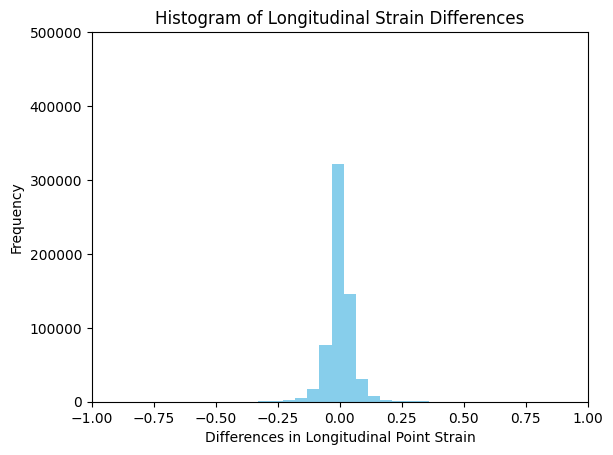

In [115]:
import matplotlib.pyplot as plt

# Plot a histogram of scalar differences
plt.hist(all_scalar_differences, bins=50, color='skyblue')
plt.xlabel('Differences in Longitudinal Point Strain')
plt.ylabel('Frequency')
plt.ylim(0, 500000)
plt.xlim(-1, 1)
plt.title('Histogram of Longitudinal Strain Differences')
plt.show()

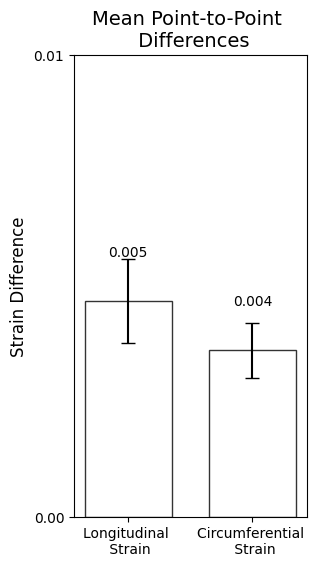

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize=(3, 6))
bars = plt.bar(['Longitudinal \n Strain', 'Circumferential \n Strain'], [long_threshold[0], circ_threshold[0] * -1], yerr = [long_threshold[4], circ_threshold[4]], facecolor='none', edgecolor='0.2', linewidth=1.0, capsize = 5, width= 0.7)
for bar in bars: 
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.35, yval + 0.0009, round(yval, 3), va='bottom', ha='center', fontsize=10, color='black')

plt.yticks([0.0, 0.01])
plt.ylabel('Strain Difference', family='sans-serif', fontsize=12)
plt.title('Mean Point-to-Point \n Differences', family='sans-serif', fontsize=14)
plt.show()

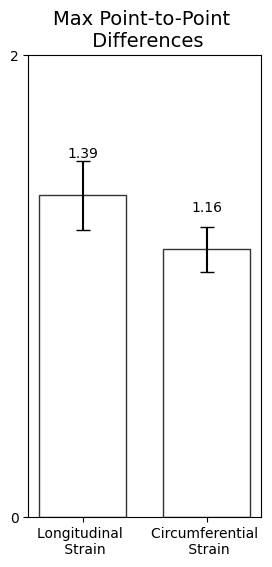

In [9]:
plt.figure(figsize=(3, 6))
bars = plt.bar(['Longitudinal \n Strain', 'Circumferential \n Strain'], [long_threshold[2], circ_threshold[2]], yerr = [long_threshold[1], circ_threshold[1]], facecolor='none', edgecolor='0.2', linewidth=1.0, capsize = 5, width= 0.7)
for bar in bars: 
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.35, yval + 0.15, round(yval, 2), va='bottom', ha='center', fontsize=10, color='black')

plt.yticks([0.0,2])

plt.title('Max Point-to-Point \n Differences', family='sans-serif', fontsize=14)
plt.show()